<h1>Chapter 5 - Text Clustering and Topic Modeling</h1>
<i>Clustering documents using a wide variety of language models.</i>

<a href="https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961"><img src="https://img.shields.io/badge/Buy%20the%20Book!-grey?logo=amazon"></a>
<a href="https://www.oreilly.com/library/view/hands-on-large-language/9781098150952/"><img src="https://img.shields.io/badge/O'Reilly-white.svg?logo=data:image/svg%2bxml;base64,PHN2ZyB3aWR0aD0iMzQiIGhlaWdodD0iMjciIHZpZXdCb3g9IjAgMCAzNCAyNyIgZmlsbD0ibm9uZSIgeG1sbnM9Imh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIj4KPGNpcmNsZSBjeD0iMTMiIGN5PSIxNCIgcj0iMTEiIHN0cm9rZT0iI0Q0MDEwMSIgc3Ryb2tlLXdpZHRoPSI0Ii8+CjxjaXJjbGUgY3g9IjMwLjUiIGN5PSIzLjUiIHI9IjMuNSIgZmlsbD0iI0Q0MDEwMSIvPgo8L3N2Zz4K"></a>
<a href="https://github.com/HandsOnLLM/Hands-On-Large-Language-Models"><img src="https://img.shields.io/badge/GitHub%20Repository-black?logo=github"></a>
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/HandsOnLLM/Hands-On-Large-Language-Models/blob/main/chapter05/Chapter%205%20-%20Text%20Clustering%20and%20Topic%20Modeling.ipynb)

---

This notebook is for Chapter 5 of the [Hands-On Large Language Models](https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961) book by [Jay Alammar](https://www.linkedin.com/in/jalammar) and [Maarten Grootendorst](https://www.linkedin.com/in/mgrootendorst/).

---

<a href="https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961">
<img src="https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/images/book_cover.png" width="350"/></a>


### [OPTIONAL] - Installing Packages on <img src="https://colab.google/static/images/icons/colab.png" width=100>

If you are viewing this notebook on Google Colab (or any other cloud vendor), you need to **uncomment and run** the following codeblock to install the dependencies for this chapter:

---

💡 **NOTE**: We will want to use a GPU to run the examples in this notebook. In Google Colab, go to
**Runtime > Change runtime type > Hardware accelerator > GPU > GPU type > T4**.

---


In [1]:
# %%capture
# !pip install bertopic datasets openai datamapplot

# **ArXiv Articles: Computation and Language**

In [2]:
# Aquí está cargando el dataset y separando dos columnas que va a utilizar después

# Load data from huggingface
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")["train"]

# Extract metadata. Separo variables y las convierto en listas normales de Python
abstracts = list(dataset["Abstracts"]) # resúmenes (abstracts) de los artículos
titles = list(dataset["Titles"]) # Sus títulos

# **A Common Pipeline for Text Clustering**

## **1. Embedding Documents**

In [3]:
from sentence_transformers import SentenceTransformer

# Create an embedding for each abstract
embedding_model = SentenceTransformer('thenlper/gte-small')
# Carga gte-small, un modelo de sentence embeddings. Su objetivo es transformar un texto completo en 
# un único vector denso que capture su contenido semántico.

embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

C:\Users\srmjf\anaconda3\envs\thellmbook\lib\site-packages\huggingface_hub\file_download.py:949: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

C:\Users\srmjf\anaconda3\envs\thellmbook\lib\site-packages\transformers\models\bert\modeling_bert.py:435: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


len(abstracts) == len(embeddings)

```text
abstract 1 ──→ gte-small ──→ embedding 1
abstract 2 ──→ gte-small ──→ embedding 2
abstract 3 ──→ gte-small ──→ embedding 3
   ...                         ...
abstract N ──→ gte-small ──→ embedding N
```

In [4]:
# Check the dimensions of the resulting embeddings
embeddings.shape

(44949, 384)

Cada embedding tiene 384 valores (dimensiones) que, juntos, representan semánticamente el documento

## **2. Reducing the Dimensionality of Embeddings**

In [5]:
from umap import UMAP

# We reduce the input embeddings from 384 dimenions to 5 dimenions
umap_model = UMAP(
    n_components=5, min_dist=0.0, metric='cosine', random_state=42
)

# n_components -> número de dimensiones q queremos obtener
# Generalmente valores entre 5 y 10 dimensiones capturan bien estructuras de altas dimensiones
# min_dist=0.0 -> cómo de juntos puede colocar UMAP los puntos en el espacio reducido
# Como después queremos hacer clustering nos interesa que UMAP genere regiones bastante compactas

reduced_embeddings = umap_model.fit_transform(embeddings)
# fit -> estudia la estructura de los embeddings y aprende cómo reducir el espacio
# transform -> Aplica la transformación

C:\Users\srmjf\anaconda3\envs\thellmbook\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


El objetivo es transformar:

```text
embedding original
 384 dimensiones
       │
       ▼
      UMAP
       │
       ▼
embedding reducido
  5 dimensiones
```

Por tanto, si antes teníamos:

```text
abstract 1 → [x₁, x₂, x₃, ............, x₃₈₄]
abstract 2 → [x₁, x₂, x₃, ............, x₃₈₄]
...
```

después tendremos:

```text
abstract 1 → [z₁, z₂, z₃, z₄, z₅]
abstract 2 → [z₁, z₂, z₃, z₄, z₅]
...
```

## **3. Cluster the Reduced Embeddings**

In [6]:
# HDBSCAN es un algoritmo de clustering basado en densidad. 
# A diferencia de K-Means, no tenemos que decirle de antemano el número de clusters (n:cluster=...)
# HDBSCAN intenta descubrir por sí mismo cuántos grupos existen observando zonas donde 
# hay una concentración suficientemente alta de puntos.
# no está obligado a asignar todos los documentos a un cluster.
# Los puntos que considera ruido reciben un -1 -> Los descarta

from hdbscan import HDBSCAN

# We fit the model and extract the clusters
hdbscan_model = HDBSCAN(
    min_cluster_size=50, metric='euclidean', cluster_selection_method='eom'
).fit(reduced_embeddings)

# min_cluster_size=50 -> un cluster debe tener como mínimo 50 puntos/documentos
# metric='euclidean' -> con menos dimensiones mejor usar distancia euclídea para detectar regiones densas
# cluster_selection_method='eom' -> criterio usado para la jerarquía de cluster
# .fit(reduced_embeddings) -> Aquí sí entrenamos/ajustamos el algoritmo de clustering sobre nuestros puntos


clusters = hdbscan_model.labels_
    #  extraemos la etiqueta que HDBSCAN ha asignado a cada abstract.
    #  abstract 0 → cluster 3
    #  abstract 1 → cluster 3
    #  abstract 2 → cluster 7
    #  abstract 3 → -1       ← ruido
    #  abstract 4 → cluster 2
    #  ...

# Por lo tanto -> len(clusters) == len(abstracts)




# How many clusters did we generate?
len(set(clusters))

# set() elilimina duplicado. Incluirá un -1 si existe outliers

161

Hemos generado 161 cluster con HDBSCAN 

## **Inspecting the Clusters**

Manually inspect the first three documents in cluster 0:

In [7]:
import numpy as np

# Print first three documents in cluster 0
# Inspeccionamos manualmente qué tipo de documentos ha metido HDBSCAN en el cluster 0.


# Recodemos que clusters contiene una etiqueta para cada abstract
# clusters= [ 2, 0, 1, 0, -1, 3, 0, 2, ...]
cluster = 0

for index in np.where(clusters==cluster)[0][:3]:
    print(abstracts[index][:300] + "... \n")

# Si clusters == 0 -> se hace una comparación elemento a elemento
# [False, True, False, True, False, False, True, False, ...]
# np.where() da como resultado una tupla con un array de índices por cada dimensión.
# como clusters es unidimensional [0] pilla la primera y única dimensión
# [:3] toma los primeros 3 elementos
#  print(abstracts[index][:300] + "... \n") ->Imprime los resúmenes con los índices correspondientes
# al cluster 0, mostrando los pirmeros 300 caracteres y añadiendo tres puntos y un salto

  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo... 

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang... 

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf... 



Next, we reduce our embeddings to 2-dimensions so that we can plot them and get a rough understanding of the generated clusters.

In [8]:
import pandas as pd

# Reduce 384-dimensional embeddings to 2 dimensions for easier visualization
reduced_embeddings = UMAP(
    n_components=2, min_dist=0.0, metric='cosine', random_state=42
).fit_transform(embeddings)

# Create dataframe
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
# Como reduced_embeddings tiene (N,2) -> 2 columnas y las llamamos x e y
df["title"] = titles
# Añade la columna title con la info de titles

df["cluster"] = [str(c) for c in clusters]
# Añade la columna cluster con los clusters
# Convierte [0, 0, 1, -1, 2, ...] en ["0", "0", "1", "-1", "2", ...]

# Select outliers and non-outliers (clusters)
clusters_df = df.loc[df.cluster != "-1", :] 
# Selecciona las filas cuyo cluster no sea "-1" y todas las columnas (:).

outliers_df = df.loc[df.cluster == "-1", :]
# contendrá solamente documentos que HDBSCAN asignó a algún cluster.

C:\Users\srmjf\anaconda3\envs\thellmbook\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### Static Plot

(-8.33977563381195,
 11.551673007011413,
 -0.9599580474197865,
 18.279680386930703)

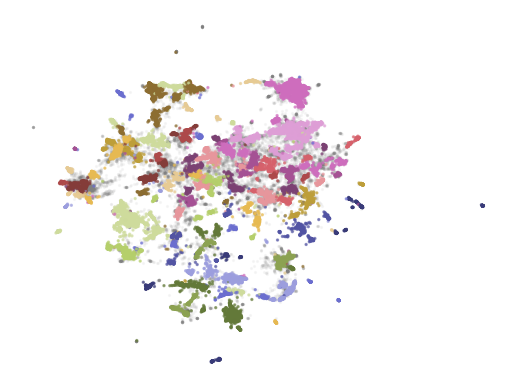

In [9]:
import matplotlib.pyplot as plt

# Plot outliers and non-outliers seperately
plt.scatter(outliers_df.x, outliers_df.y, alpha=0.05, s=2, c="grey")
# dibuja los outliers
# plt.scatter -> gráfico de dispersión para cada punto (x,y) correspondiente a cada abstract
# alpha -> nivel de transparencia. Va de 0 (completamente transparente) a 1 (completamente opaco)
# s=2 -> tamaño de los puntos
# c="grey" -> color de los puntos -> outliers -> grises



plt.scatter(
    clusters_df.x, clusters_df.y, c=clusters_df.cluster.astype(int),
    alpha=0.6, s=2, cmap='tab20b'
)
plt.axis('off')

# Dibuja  los documentos que sí pertenecen a clusters
# c=clusters_df.cluster.astype(int) -> como antes convertimos los clusters en string, los pasa a integer
# Para que Matplotlib pueda utilizar esos números para decidir el color de cada punto.
# cmap='tab20b'->mapa de color. tab20b es una paleta de Matplotlib pensada xa representar distints categorías

# plt.savefig("matplotlib.png", dpi=300)  # Uncomment to save the graph as a .png

# From Text Clustering to Topic Modeling

## **BERTopic: A Modular Topic Modeling Framework**

In [10]:
from bertopic import BERTopic

# Train our model with our previously defined models
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model, # no tiene por qué ser umap -> PCA
    hdbscan_model=hdbscan_model, # podríamos usar kmeans_model
    verbose=True
).fit(abstracts, embeddings)

# si no hubiésemes definido antes "embeddings" -> fit(abstracts)

2026-09-01 09:00:45,358 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2026-09-01 09:01:17,896 - BERTopic - Dimensionality - Completed ✓
2026-09-01 09:01:17,900 - BERTopic - Cluster - Start clustering the reduced embeddings
2026-09-01 09:01:18,892 - BERTopic - Cluster - Completed ✓
2026-09-01 09:01:18,908 - BERTopic - Representation - Extracting topics from clusters using representation models.
2026-09-01 09:01:22,096 - BERTopic - Representation - Completed ✓


Now, let's start exploring the topics that we got by running the code above.

In [11]:
# Exploremos los topics creados

topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,15188,-1_the_of_and_to,"[the, of, and, to, in, we, language, for, that...",[ Text matching is the task of matching two t...
1,0,1694,0_speech_asr_recognition_acoustic,"[speech, asr, recognition, acoustic, end, spea...",[ The speech chain mechanism integrates autom...
2,1,1592,1_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, healt...",[ There is an increasing interest in developi...
3,2,1189,2_translation_nmt_machine_english,"[translation, nmt, machine, english, bleu, neu...",[ Neural machine translation (NMT) becomes a ...
4,3,871,3_hate_offensive_speech_detection,"[hate, offensive, speech, detection, toxic, so...",[ The enormous amount of data being generated...
...,...,...,...,...,...
156,155,52,155_counseling_mental_therapy_health,"[counseling, mental, therapy, health, psychoth...",[ Mental health care poses an increasingly se...
157,156,51,156_moe_experts_mixture_routing,"[moe, experts, mixture, routing, expert, spars...",[ The Mixture of Experts (MoE) models are an ...
158,157,51,157_opinion_reviews_summaries_summarization,"[opinion, reviews, summaries, summarization, s...",[ When faced with a large number of product r...
159,158,50,158_backdoor_attacks_attack_triggers,"[backdoor, attacks, attack, triggers, poisoned...",[ Deep neural networks (DNNs) and natural lan...


Hundreds of topics were generated using the default model! To get the top 10 keywords per topic as well as their c-TF-IDF weights, we can use the `get_topic()` function:

In [12]:
# Para inspeccionar los topics individuales
topic_model.get_topic(0)

[('speech', 0.028556068552107794),
 ('asr', 0.019251316103179726),
 ('recognition', 0.014145439631008476),
 ('acoustic', 0.010413239711741828),
 ('end', 0.010344305152204948),
 ('speaker', 0.0075600291358406515),
 ('wer', 0.007438546276179302),
 ('error', 0.006612763114583605),
 ('audio', 0.0064653426225876635),
 ('ctc', 0.006382937081920834)]

We can use the `find_topics()` function to search for specific topics based on a search term. Let’s search for a topic about topic modeling:

In [13]:
topic_model.find_topics("topic modeling")

([23, -1, 1, 31, 30],
 [0.95455986, 0.91132784, 0.90941536, 0.90817875, 0.90487814])

It returns that topic 22 has a relatively high similarity (0.95) with our search term. If we then inspect the topic, we can see that it is indeed a topic about topic modeling:

In [14]:
topic_model.get_topic(22)

[('emotion', 0.03936174842160262),
 ('multimodal', 0.025679798554526692),
 ('erc', 0.020825977228523588),
 ('recognition', 0.01490426989589966),
 ('emotions', 0.014411772809335305),
 ('fusion', 0.014390232606140316),
 ('modalities', 0.01334956330835965),
 ('modality', 0.012232957858580097),
 ('emotional', 0.01193128388350725),
 ('sentiment', 0.011700972692231654)]

That seems like a topic that is, in part, characterized by the classic LDA technique. Let's see if the BERTopic paper was also assigned to topic 22:

In [15]:
topic_model.topics_[titles.index('BERTopic: Neural topic modeling with a class-based TF-IDF procedure')]

23

It is! We expected it might be because there are non-LDA specific words in the topic describtion such as "clustering" and "topic".

### **Visualizations**

**Visualize Documents**

In [16]:
# Visualize topics and documents
fig = topic_model.visualize_documents(
    titles,
    reduced_embeddings=reduced_embeddings,
    width=1200,
    hide_annotations=True
)

# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

# fig.show(renderer="browser")

In [17]:
# Visualize barchart with ranked keywords
topic_model.visualize_barchart()

In [18]:
# Visualize relationships between topics
topic_model.visualize_heatmap(n_clusters=30)

In [19]:
# Visualize the potential hierarchical structure of topics
topic_model.visualize_hierarchy()

## **Representation Models**

In these examples that follow, we will update our topic representations **after** having trained our model. This allows for quick iteration. If, however, you want to use a representation model at the start of training, you will need to run it as follows:

```python
from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic

# Create your representation model
representation_model = KeyBERTInspired()

# Use the representation model in BERTopic on top of the default pipeline
topic_model = BERTopic(representation_model=representation_model)
```

To use the representation models, we are first going to duplicate our topic model such that easily show the differences between a model with and without representation model.

In [20]:
# Save original representations
# Estamos guardando una copia independiente de la representación actual de los topics antes de modificarla.

from copy import deepcopy
# deepcopy -> rea una copia profunda de un objeto

original_topics = deepcopy(topic_model.topic_representations_)
# topic_model.topic_representations_ -> contiene la representación actual de cada topic, es decir, 
# las palabras y pesos que BERTopic ha obtenido hasta ese momento, antes de aplicar nuevos representation models.

In [21]:
def topic_differences(model, original_topics, nr_topics=5):
    """Show the differences in topic representations between two models """
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    # crea un df vacío con 3 columnas
    for topic in range(nr_topics): # recorre 0, 1, 2, 3, 4 y 5 

        # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        # original_topics[topic] -> Lista con tuplas (palabra, peso)
             # [
                   # ("summarization", 0.42),
                   # ("summaries", 0.38),
                   # ("summary", 0.35),
                   # ("abstractive", 0.31),
                   # ("document", 0.29),
                #]
        
        # zip(*original_topics[topic]) -> "desempaqueta" las tuplas y separa palabras y pesos:
                #(("summarization", "summaries", "summary", "abstractive", "document"),
                # (0.42, 0.38, 0.35, 0.31, 0.29))
        # list(...)[0] -> crea una lista y se queda con el primer grupo, las palabras
        # [:5] -> toma las primneras 5 palabras
        # " | ".join(...) -> juan todo separando con |
               
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        # Hace lo mismo pero con el modelo nuevo
        df.loc[len(df)] = [topic, og_words, new_words]
        # añade una fila nueva al DataFrame
    return df

# función recibe:
    # model: el BERTopic actualizado.
    # original_topics: la copia que guardamos antes con deepcopy.
    # nr_topics=5: por defecto compara los primeros 5 topics.

### KeyBERTInspired

In [22]:
from bertopic.representation import KeyBERTInspired
#importamos el modelo de representación

# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
# cremos una instancia con sus parámetros por defecto


topic_model.update_topics(abstracts, representation_model=representation_model)
# No entrenamos BERTopic de nuevo (embeddings+UMAP+HDBSCAN)
# Los cluster siguen siendo los mismo
# Actualizamos la representación de cada topic
    # antes: c-TF-IDF -> Palabras originales
    # después: KeyBERTInspired-> palabras rerankeadas semánticamente

# Show topic differences
topic_differences(topic_model, original_topics)
# aplicamos la función de antes para ver diferencia con original topics

,Topic,Original,Updated
0,0,speech | asr | recognition | acoustic | end,transcription | speech | phonetic | encoder | ...
1,1,medical | clinical | biomedical | patient | he...,nlp | clinical | corpus | medicine | language
2,2,translation | nmt | machine | english | bleu,translation | translating | translate | transl...
3,3,hate | offensive | speech | detection | toxic,hate | hateful | language | offensive | twitter
4,4,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...


### Maximal Marginal Relevance

In [23]:
from bertopic.representation import MaximalMarginalRelevance

# Update our topic representations to MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)
# Creamos el reranker con MMR
# diversity=0.5 -> equilibrio entre relevancia y diversidad

topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,speech | asr | recognition | acoustic | end,asr | audio | ctc | training | model
1,1,medical | clinical | biomedical | patient | he...,clinical | biomedical | patient | healthcare |...
2,2,translation | nmt | machine | english | bleu,translation | nmt | bleu | neural | parallel
3,3,hate | offensive | speech | detection | toxic,offensive | toxic | social | hateful | platforms
4,4,summarization | summaries | summary | abstract...,summarization | extractive | rouge | factual |...


## Text Generation



### Flan-T5

In [28]:
from transformers import pipeline
# Para cargar el modelo generativo
from bertopic.representation import TextGeneration
# Para el representation model
prompt = """I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""

# Los marcadores [DOCUMENTS] Y [KEYWORDS] los sustituirá BERTopic x los docuemntos representantivos y ls keywords del topic correspondient

# Update our topic representations using Flan-T5
generator = pipeline('text2text-generation', model='google/flan-t5-small')
# carga Flan-T5 Small para generación de texto a texto.

representation_model = TextGeneration(
    generator, prompt=prompt, doc_length=50, tokenizer="whitespace"
)

# envolvemos el generador para que BERTopic pueda usarlo como modelo de representación
# doc_length=50 -> limita cada documento representativo a 50 tokens, para no pasar textos enormes al modelo
# tokenizer="whitespace" -> esos 50 tokens se separarán por los espacions (tokenización muy simple)

topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|██████████| 161/161 [00:28<00:00,  5.70it/s]


,Topic,Original,Updated
0,0,speech | asr | recognition | acoustic | end,Speech recognition | | | |
1,1,medical | clinical | biomedical | patient | he...,Science/Tech | | | |
2,2,translation | nmt | machine | english | bleu,Science/Tech | | | |
3,3,hate | offensive | speech | detection | toxic,Science/Tech | | | |
4,4,summarization | summaries | summary | abstract...,Abstractive summarization | | | |


### OpenAI

In [ ]:
import openai
from bertopic.representation import OpenAI

prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short topic label in the following format:
topic: <short topic label>
"""

# Update our topic representations using GPT-3.5
client = openai.OpenAI(api_key="YOUR_KEY_HERE")
representation_model = OpenAI(
    client, model="gpt-3.5-turbo", exponential_backoff=True, chat=True, prompt=prompt
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|██████████| 156/156 [02:13<00:00,  1.17it/s]


,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,Leveraging External Data for Improving Low-Res...
1,1,medical | clinical | biomedical | patient | he...,Improved Representation Learning for Biomedica...
2,2,sentiment | aspect | analysis | reviews | opinion,"""Advancements in Aspect-Based Sentiment Analys..."
3,3,translation | nmt | machine | neural | bleu,Neural Machine Translation Enhancements
4,4,summarization | summaries | summary | abstract...,Document Summarization Techniques


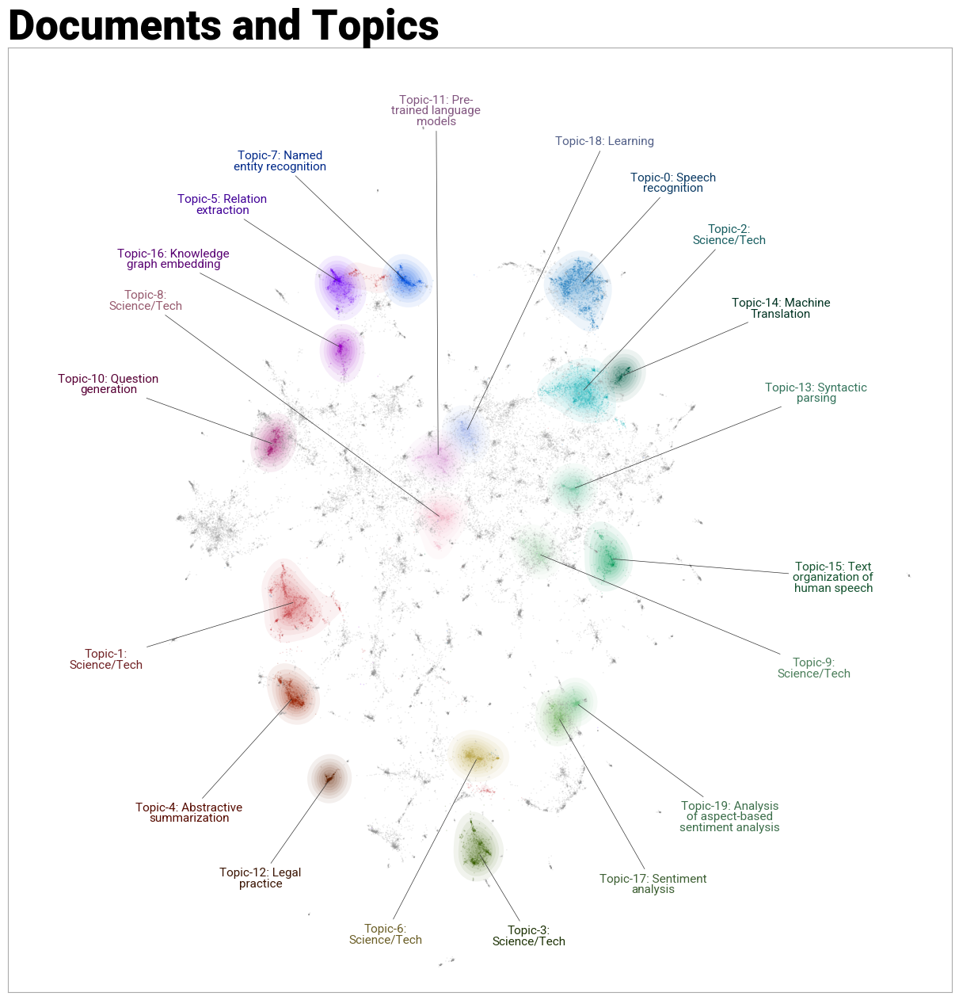

In [29]:
# Visualize topics and documents
fig = topic_model.visualize_document_datamap(
    titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings,
    width=1200, # ancho de la figura
    label_font_size=11,
    label_wrap_width=20,
    use_medoids=True,
)
plt.savefig("datamapplot.png", dpi=300)

# titles -> son las etiquetas/textos asocuados a cada documento
# topics=list(range(20)) -> visualizar solo los topics 0 a 19.
# usamos las coodenadas 2d que calculamos con UMAP
# use_medoids=True -> medoid: edocumento real que está mñas cerca del centro representativo de un grupo


## **BONUS**: Word Cloud

Make sure to pip install `wordcloud` first in order to follow this bonus:


First, we need to make sure that each topic is described by a bit more words than just 10 as that would make for a much more interesting wordcloud.

In [30]:
topic_model.update_topics(abstracts, top_n_words=500)

# vuelve a actualizar la representación de los topics, pero aquí no estás cambiando el modelo de representación:
# simplemente le dices a BERTopic que conserve muchas más palabras por topic
# Hasta ahora guardaba las 10 palabras más representativas

2026-09-01 11:32:33,719 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


Then, we can run the following code to generate the wordcloud for our topic modeling topic:

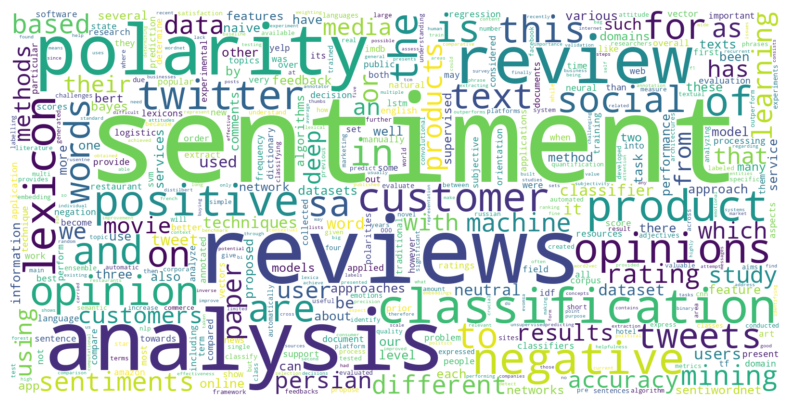

In [33]:
# Este bloque toma las palabras y pesos de un topic de BERTopic y construye una nube de palabras, 
# donde el tamaño de cada palabra depende de su peso.

from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    plt.figure(figsize=(10,5))
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000, width=1600, height=800)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear") # suaviza el escalado
    plt.axis("off") # quita los ejes
    plt.show() # muestra resultado

# model.get_topic(topic) devuelve algo del estilo:
        # [
        #    ("model", 0.081),
        #    ("topic", 0.074),
        #    ("clustering", 0.061),
        #    ...
        # ]
# La comprendión de dccionario lo convierte en: (formato que necesita wc.generate_from_frequencies())
    # {
    #    "model": 0.081,
    #    "topic": 0.074,
    #    "clustering": 0.061,
    #    ...
    # }



# Show wordcloud
create_wordcloud(topic_model, topic=17)
Llamamos a la función para el topic 17